# Inference notenook for [CLIP prefix captioning](https://github.com/rmokady/CLIP_prefix_caption/)

Disclaimer: the authors do not own any rights for the code or data.

In [1]:
#@title Install
!pip install tokenizers>=0.14.1
!pip install transformers==4.29.2
! pip install git+https://github.com/openai/CLIP.git


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.3/112.3 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.9/314.9 kB 18.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 69.1 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × Building wheel for tokenizers (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for tokenizers
Failed to build tokenizers
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (tokenizers)
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-3e8uf8_s
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-3e8uf8_s
  Res

In [2]:
!pip install pydrive

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 987.4/987.4 kB 17.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pydrive: filename=PyDrive-1.3.1-py3-none-any.whl size=27433 sha256=1904a6ebc2a4ff351b7a07f164f2bd9a1de3bfb91bdc8f0b632b1f9b172aa03e
  Stored in directory: /root/.cache/pip/wheels/6c/10/da/a5b513f5b3916fc391c20ee7b4633e5cf3396d570cdd74970f
Successfully built pydrive


In [3]:
!pip install gdown

In [4]:
#@title Drive Downloader

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

download_with_pydrive = False #@param {type:"boolean"}

class Downloader(object):
    def __init__(self, use_pydrive):
        self.use_pydrive = use_pydrive

        if self.use_pydrive:
            self.authenticate()

    def authenticate(self):
        auth.authenticate_user()
        gauth = GoogleAuth()
        gauth.credentials = GoogleCredentials.get_application_default()
        self.drive = GoogleDrive(gauth)

    def download_file(self, file_id, file_dst):
        if self.use_pydrive:
            downloaded = self.drive.CreateFile({'id':file_id})
            downloaded.FetchMetadata(fetch_all=True)
            downloaded.GetContentFile(file_dst)
        else:
            !gdown --id $file_id -O $file_dst

downloader = Downloader(download_with_pydrive)

In [5]:
#@title Imports

import clip
import os
from torch import nn
import numpy as np
import torch
import torch.nn.functional as nnf
import sys
from typing import Tuple, List, Union, Optional
from transformers import GPT2Tokenizer, GPT2LMHeadModel, get_linear_schedule_with_warmup
from tqdm import tqdm, trange
from google.colab import files
import skimage.io as io
import PIL.Image
from IPython.display import Image


N = type(None)
V = np.array
ARRAY = np.ndarray
ARRAYS = Union[Tuple[ARRAY, ...], List[ARRAY]]
VS = Union[Tuple[V, ...], List[V]]
VN = Union[V, N]
VNS = Union[VS, N]
T = torch.Tensor
TS = Union[Tuple[T, ...], List[T]]
TN = Optional[T]
TNS = Union[Tuple[TN, ...], List[TN]]
TSN = Optional[TS]
TA = Union[T, ARRAY]


D = torch.device
CPU = torch.device('cpu')


def get_device(device_id: int) -> D:
    if not torch.cuda.is_available():
        return CPU
    device_id = min(torch.cuda.device_count() - 1, device_id)
    return torch.device(f'cuda:{device_id}')


CUDA = get_device

current_directory = os.getcwd()
save_path = os.path.join(os.path.dirname(current_directory), "pretrained_models")
os.makedirs(save_path, exist_ok=True)
model_path = os.path.join(save_path, 'model_wieghts.pt')


In [6]:
#@title Model

class MLP(nn.Module):

    def forward(self, x: T) -> T:
        return self.model(x)

    def __init__(self, sizes: Tuple[int, ...], bias=True, act=nn.Tanh):
        super(MLP, self).__init__()
        layers = []
        for i in range(len(sizes) -1):
            layers.append(nn.Linear(sizes[i], sizes[i + 1], bias=bias))
            if i < len(sizes) - 2:
                layers.append(act())
        self.model = nn.Sequential(*layers)


class ClipCaptionModel(nn.Module):

    #@functools.lru_cache #FIXME
    def get_dummy_token(self, batch_size: int, device: D) -> T:
        return torch.zeros(batch_size, self.prefix_length, dtype=torch.int64, device=device)

    def forward(self, tokens: T, prefix: T, mask: Optional[T] = None, labels: Optional[T] = None):
        embedding_text = self.gpt.transformer.wte(tokens)
        prefix_projections = self.clip_project(prefix).view(-1, self.prefix_length, self.gpt_embedding_size)
        #print(embedding_text.size()) #torch.Size([5, 67, 768])
        #print(prefix_projections.size()) #torch.Size([5, 1, 768])
        embedding_cat = torch.cat((prefix_projections, embedding_text), dim=1)
        if labels is not None:
            dummy_token = self.get_dummy_token(tokens.shape[0], tokens.device)
            labels = torch.cat((dummy_token, tokens), dim=1)
        out = self.gpt(inputs_embeds=embedding_cat, labels=labels, attention_mask=mask)
        return out

    def __init__(self, prefix_length: int, prefix_size: int = 512):
        super(ClipCaptionModel, self).__init__()
        self.prefix_length = prefix_length
        self.gpt = GPT2LMHeadModel.from_pretrained('gpt2')
        self.gpt_embedding_size = self.gpt.transformer.wte.weight.shape[1]
        if prefix_length > 10:  # not enough memory
            self.clip_project = nn.Linear(prefix_size, self.gpt_embedding_size * prefix_length)
        else:
            self.clip_project = MLP((prefix_size, (self.gpt_embedding_size * prefix_length) // 2, self.gpt_embedding_size * prefix_length))


class ClipCaptionPrefix(ClipCaptionModel):

    def parameters(self, recurse: bool = True):
        return self.clip_project.parameters()

    def train(self, mode: bool = True):
        super(ClipCaptionPrefix, self).train(mode)
        self.gpt.eval()
        return self

In [7]:
#@title Caption prediction

def generate_beam(model, tokenizer, beam_size: int = 5, prompt=None, embed=None,
                  entry_length=67, temperature=1., stop_token: str = '.'):

    model.eval()
    stop_token_index = tokenizer.encode(stop_token)[0]
    tokens = None
    scores = None
    device = next(model.parameters()).device
    seq_lengths = torch.ones(beam_size, device=device)
    is_stopped = torch.zeros(beam_size, device=device, dtype=torch.bool)
    with torch.no_grad():
        if embed is not None:
            generated = embed
        else:
            if tokens is None:
                tokens = torch.tensor(tokenizer.encode(prompt))
                tokens = tokens.unsqueeze(0).to(device)
                generated = model.gpt.transformer.wte(tokens)
        for i in range(entry_length):
            outputs = model.gpt(inputs_embeds=generated)
            logits = outputs.logits
            logits = logits[:, -1, :] / (temperature if temperature > 0 else 1.0)
            logits = logits.softmax(-1).log()
            if scores is None:
                scores, next_tokens = logits.topk(beam_size, -1)
                generated = generated.expand(beam_size, *generated.shape[1:])
                next_tokens, scores = next_tokens.permute(1, 0), scores.squeeze(0)
                if tokens is None:
                    tokens = next_tokens
                else:
                    tokens = tokens.expand(beam_size, *tokens.shape[1:])
                    tokens = torch.cat((tokens, next_tokens), dim=1)
            else:
                logits[is_stopped] = -float(np.inf)
                logits[is_stopped, 0] = 0
                scores_sum = scores[:, None] + logits
                seq_lengths[~is_stopped] += 1
                scores_sum_average = scores_sum / seq_lengths[:, None]
                scores_sum_average, next_tokens = scores_sum_average.view(-1).topk(beam_size, -1)
                next_tokens_source = next_tokens // scores_sum.shape[1]
                seq_lengths = seq_lengths[next_tokens_source]
                next_tokens = next_tokens % scores_sum.shape[1]
                next_tokens = next_tokens.unsqueeze(1)
                tokens = tokens[next_tokens_source]
                tokens = torch.cat((tokens, next_tokens), dim=1)
                generated = generated[next_tokens_source]
                scores = scores_sum_average * seq_lengths
                is_stopped = is_stopped[next_tokens_source]
            next_token_embed = model.gpt.transformer.wte(next_tokens.squeeze()).view(generated.shape[0], 1, -1)
            generated = torch.cat((generated, next_token_embed), dim=1)
            is_stopped = is_stopped + next_tokens.eq(stop_token_index).squeeze()
            if is_stopped.all():
                break
    scores = scores / seq_lengths
    output_list = tokens.cpu().numpy()
    output_texts = [tokenizer.decode(output[:int(length)]) for output, length in zip(output_list, seq_lengths)]
    order = scores.argsort(descending=True)
    output_texts = [output_texts[i] for i in order]
    return output_texts


def generate2(
        model,
        tokenizer,
        tokens=None,
        prompt=None,
        embed=None,
        entry_count=1,
        entry_length=67,  # maximum number of words
        top_p=0.8,
        temperature=1.,
        stop_token: str = '.',
):
    model.eval()
    generated_num = 0
    generated_list = []
    stop_token_index = tokenizer.encode(stop_token)[0]
    filter_value = -float("Inf")
    device = next(model.parameters()).device

    with torch.no_grad():

        for entry_idx in trange(entry_count):
            if embed is not None:
                generated = embed
            else:
                if tokens is None:
                    tokens = torch.tensor(tokenizer.encode(prompt))
                    tokens = tokens.unsqueeze(0).to(device)

                generated = model.gpt.transformer.wte(tokens)

            for i in range(entry_length):

                outputs = model.gpt(inputs_embeds=generated)
                logits = outputs.logits
                logits = logits[:, -1, :] / (temperature if temperature > 0 else 1.0)
                sorted_logits, sorted_indices = torch.sort(logits, descending=True)
                cumulative_probs = torch.cumsum(nnf.softmax(sorted_logits, dim=-1), dim=-1)
                sorted_indices_to_remove = cumulative_probs > top_p
                sorted_indices_to_remove[..., 1:] = sorted_indices_to_remove[
                                                    ..., :-1
                                                    ].clone()
                sorted_indices_to_remove[..., 0] = 0

                indices_to_remove = sorted_indices[sorted_indices_to_remove]
                logits[:, indices_to_remove] = filter_value
                next_token = torch.argmax(logits, -1).unsqueeze(0)
                next_token_embed = model.gpt.transformer.wte(next_token)
                if tokens is None:
                    tokens = next_token
                else:
                    tokens = torch.cat((tokens, next_token), dim=1)
                generated = torch.cat((generated, next_token_embed), dim=1)
                if stop_token_index == next_token.item():
                    break

            output_list = list(tokens.squeeze().cpu().numpy())
            output_text = tokenizer.decode(output_list)
            generated_list.append(output_text)

    return generated_list[0]

In [25]:
#@title Choose pretrained model - COCO or Coneptual captions


pretrained_model = 'COCO'  # @param ['COCO', 'Conceptual captions']

if pretrained_model == 'Conceptual captions':
  downloader.download_file("14pXWwB4Zm82rsDdvbGguLfx9F8aM7ovT", model_path)
else:
  downloader.download_file("1IdaBtMSvtyzF0ByVaBHtvM0JYSXRExRX", model_path)

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1IdaBtMSvtyzF0ByVaBHtvM0JYSXRExRX
From (redirected): https://drive.google.com/uc?id=1IdaBtMSvtyzF0ByVaBHtvM0JYSXRExRX&confirm=t&uuid=be27ae3b-1be6-4485-81d1-bba1943a1ca5
To: /pretrained_models/model_wieghts.pt
100% 636M/636M [00:17<00:00, 37.2MB/s]


In [26]:
#@title GPU/CPU


is_gpu = True #@param {type:"boolean"}


In [27]:
#@title CLIP model + GPT2 tokenizer

device = CUDA(0) if is_gpu else "cpu"
clip_model, preprocess = clip.load("ViT-B/32", device=device, jit=False)
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")

In [28]:
#@title Load model weights


prefix_length = 10

model = ClipCaptionModel(prefix_length)

model.load_state_dict(torch.load(model_path, map_location=CPU), strict=False) # added ```strict=False```

model = model.eval()
device = CUDA(0) if is_gpu else "cpu"
model = model.to(device)


In [29]:
#@title Upload Image


uploaded = files.upload()

if not uploaded:
  UPLOADED_FILE = ''
elif len(uploaded) == 1:
  UPLOADED_FILE = list(uploaded.keys())[0]
else:
  raise AssertionError('Please upload one image at a time')

print(UPLOADED_FILE)

In [30]:
#@title Or download random samples form COCO test set (Karpathy et al. split)

IMAGE_NAME = '354533'  # @param ['562207', '579664', '060623', '165547', '334321', '483108', '386164', '354533']

name_ = "COCO_val2014_000000" + IMAGE_NAME + ".jpg"
images_path = os.path.join(os.path.dirname(current_directory), "images")
os.makedirs(images_path, exist_ok=True)
UPLOADED_FILE = os.path.join(images_path, name_)

if not os.path.isfile(UPLOADED_FILE):
  download_path = os.path.join(images_path, "images.zip")
  downloader.download_file("1BwJeBME-dpwcCT8IXYeWz7uaPkbexjNB", download_path)

  !unzip {download_path} -d {images_path}



Conceptual captions examples:
https://drive.google.com/file/d/1mzH3b0LQrGEWjEva4hI6HE_fIYRIgtBT/view?usp=sharing

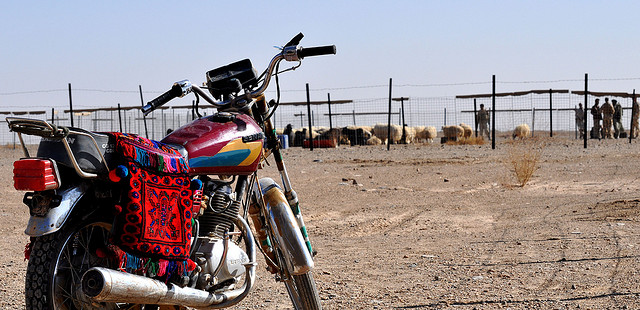

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]



A motorcycle parked on a dirt road near a fence.


In [31]:
#@title Inference
use_beam_search = False #@param {type:"boolean"}

image = io.imread(UPLOADED_FILE)
pil_image = PIL.Image.fromarray(image)
#pil_img = Image(filename=UPLOADED_FILE)
display(pil_image)

image = preprocess(pil_image).unsqueeze(0).to(device)
with torch.no_grad():
    # if type(model) is ClipCaptionE2E:
    #     prefix_embed = model.forward_image(image)
    # else:
    prefix = clip_model.encode_image(image).to(device, dtype=torch.float32)
    prefix_embed = model.clip_project(prefix).reshape(1, prefix_length, -1)
if use_beam_search:
    generated_text_prefix = generate_beam(model, tokenizer, embed=prefix_embed)[0]
else:
    generated_text_prefix = generate2(model, tokenizer, embed=prefix_embed)


print('\n')
print(generated_text_prefix)

## Enhancing generated captions with an LLM
A simple example

In [32]:
import dotenv

dotenv.load_dotenv()
import os

from openai import AzureOpenAI

api_key = os.getenv("OPENAI_API_KEY")

openai_client = AzureOpenAI(
    api_key=api_key,
    api_version="2024-06-01",
    azure_endpoint="https://hkust.azure-api.net",
    azure_deployment="gpt-4o-mini",
)


In [33]:
def get_LLM_output(system_prompt: str, user_prompt: str) -> str:
    """
    Gets generation output from LLM
    """
    response = openai_client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {"role": "system", "content": system_prompt},
            {"role": "user", "content": user_prompt}
        ],
    )
    return response.choices[0].message.content

In [34]:
system_prompt = """You are an image captioner. You will be provided with a caption generated by a CLIP-based model as well as some text in the original source.
Note that the CLIP model takes in only the image, and hence does not represent fully the entire context.

Your task is to enhance the image caption with context from the original source. While adding in auxiliary information, do not deviate from the provided caption too much.
Keep the enhanced caption within two lines, and do not give excessive information in the caption. Remain factual in enhancing the caption.
Entities and claims are the first priority, avoid unnecessary descriptions such as overuse of adjectives.

Provide the enhanced caption with the following information.
"""

In [35]:
user_prompt = f"""The Gobi Desert does not simply host a race; it dictates the terms of a profound confrontation between human spirit and elemental force. The 2018 BMW GS Trophy in Mongolia presented a journey where riders faced a 470-kilometer opening day that was a trial in climatic extremes, the mercury swinging from a biting 10°C at dawn to a scorching 26°C by noon . This was a mere prelude to the vastness of the Gobi itself, the world's fifth-largest desert, a landscape of stark beauty and relentless challenge composed of jagged rock, hard-packed gravel, and treacherous, soft sand that brought many a rider to their knees .

The true test was the terrain. What appeared from a distance as a barren, rocky plain revealed itself at speed to be a complex obstacle course. Exposed boulders and stubborn, hardened clumps of camel grass lay in wait, while immense stretches of sand demanded constant, exhausting effort to maintain momentum and balance . The "Camel Head" challenge, a technical section combining rock climbing and deep sand, epitomized the extreme skill required to navigate this environment, underscoring that the primary opponent was never another rider, but the desert itself .

[image: {generated_text_prefix}]

Beyond the grueling competition, the experience was defined by a unique camaraderie born of shared hardship. By night, the relentless sun gave way to a sky brilliant with stars, and the roaring engines were silenced. Riders from across the globe—businesspeople, mechanics, pilots—gathered at campsites, sharing stories over meals, their diverse backgrounds dissolving into a unified community bound by a passion for exploration . This spirit was palpable even when the desert unleashed its fury, with sudden sandstorms transforming the camps into chaotic, unforgettable scenes .

The ultimate lesson of a Gobi race is one of humility and resilience. It is a place where meticulous preparation meets the unpredictable, where a sudden change in the ground or a hidden obstacle can alter everything in an instant. To ride here is to engage in a dialogue with the earth, a physical and mental ordeal that forges a powerful connection to one of the planet's last great wildernesses. It is an adventure that etches itself not just as a memory of speed and competition, but as a testament to the enduring call of the unknown .
"""
# Sample text generated by Deepseek, corresponds to image 354533

In [36]:
get_LLM_output(system_prompt=system_prompt, user_prompt=user_prompt)

'A motorcycle parked on a dirt road near a fence in the Gobi Desert, which hosts the 2018 BMW GS Trophy, where riders confronted extreme climate and challenging terrain during a 470-kilometer opening day. This event fostered camaraderie among international participants amid the vast, rugged landscape, highlighting the enduring spirit of exploration.'

Wrapped in a better-structured API

In [ ]:
# The code in this function was taken from demo code provided above by the original authors of the paper in this notebook

def get_CLIP_caption_from_image(image_path: str, use_beam_search: bool = False) -> str:
    """
    Gets image caption from a CLIP-based model

    Args:
        image_path (str): Path to image
        use_beam_search (bool): Indicates whether to use beam search in autoregressive token generation
    """
    image = io.imread(image_path)
    pil_image = PIL.Image.fromarray(image)
    #pil_img = Image(filename=UPLOADED_FILE)
    display(pil_image)

    image = preprocess(pil_image).unsqueeze(0).to(device)
    with torch.no_grad():
        # if type(model) is ClipCaptionE2E:
        #     prefix_embed = model.forward_image(image)
        # else:
        prefix = clip_model.encode_image(image).to(device, dtype=torch.float32)
        prefix_embed = model.clip_project(prefix).reshape(1, prefix_length, -1)
    if use_beam_search:
        generated_text_prefix = generate_beam(model, tokenizer, embed=prefix_embed)[0]
    else:
        generated_text_prefix = generate2(model, tokenizer, embed=prefix_embed)

    return generated_text_prefix

In [38]:
%pip install pymupdf

In [ ]:
import fitz
import os

def extract_images_with_context(pdf_path: str, output_image_dir: str) -> list[dict]:
    """
    Extracts images and their surrounding text context from a PDF document.

    Args:
        pdf_path (str): Path to the source PDF file
        output_image_dir (str): Directory where extracted images will be saved
    """

    os.makedirs(output_image_dir, exist_ok=True)

    doc = fitz.open(pdf_path)

    image_paths_and_contexts = []

    for page_num in range(len(doc)):
        page = doc.load_page(page_num)

        # all text blocks from the current page (including coordinates)
        text_blocks = page.get_text("blocks")
        text_blocks.sort(key=lambda block: block[1])  # sort vertically

        image_list = page.get_images(full=True)

        for img_index, img in enumerate(image_list):
            xref = img[0]
            pix = fitz.Pixmap(doc, xref)

            # coordinates of current image
            img_rect = page.get_image_bbox(img)
            img_x0, img_y0, img_x1, img_y1 = img_rect
            img_width = img_x1 - img_x0
            img_height = img_y1 - img_y0

            # image location and size
            # print(f"Page {page_num+1}, Image {img_index+1}:")
            # print(f"  Location: ({img_x0:.2f}, {img_y0:.2f})")
            # print(f"  Size: {img_width:.2f} x {img_height:.2f}")

            image_filename = f"page_{page_num+1}_img_{img_index+1}.png"
            image_path = os.path.join(output_image_dir, image_filename)
            pix.save(image_path)    # saves image to file system

            context_blocks = []
            for block in text_blocks:
                block_rect = fitz.Rect(block[:4])
                block_text = block[4].strip()

                # text close to image is used as context
                if (abs(block_rect.y1 - img_y0) < 50 or abs(block_rect.y0 - img_y1) < 50):
                    context_blocks.append(block_text)

            context_text = " ".join(context_blocks)

            image_paths_and_contexts.append({
                "context": context_text,
                "image_path": image_path
            })

            pix = None

    doc.close()

    return image_paths_and_contexts

In [ ]:
class LLMforCaption:
  def __init__(self):
    api_key = os.getenv("OPENAI_API_KEY")
    self.llm_client = AzureOpenAI(
        api_key=api_key,
        api_version="2024-06-01",
        azure_endpoint="https://hkust.azure-api.net",
        azure_deployment="gpt-4o-mini",
    )


  def _get_system_prompt_captiongen(self) -> str:
    """
    Provides system prompt for use in the LLM in this object
    """
    system_prompt = """You are an image captioner. You will be provided with a caption generated by a CLIP-based model as well as some text in the original source.
  Note that the CLIP model takes in only the image, and hence does not represent fully the entire context.

  Your task is to enhance the image caption with context from the original source. While adding in auxiliary information, do NOT deviate from the provided caption too much.
  Keep the enhanced caption within two lines, and do not give excessive information in the caption. Remain factual in enhancing the caption.
  Entities and claims are the first priority, avoid unnecessary descriptions such as overuse of adjectives.

  While you may be provided with a caption generated by a CLIP-based model, that caption might not accurately reflect what is being presented by the image, since no context is provided.
  If you find the caption deviating a lot from the context, please put more weight onto the context.

  Provide the enhanced caption with the following information.
  """
    return system_prompt


  def _create_user_prompt(self, simple_caption: str, context: str) -> str:
    """
    Creates a user prompt to be passed to the LLM

    Args:
        simple_caption (str): Caption provided by CLIP-based image captioning model
        context (str): Context of the document surrounding the image to be captioned
    """
    user_prompt = f"""You are provided with the caption generated conditioned ONLY on the image, and the context from the source document as follows:
  # Caption generated using only the image and NOTHING ELSE
  {simple_caption}

  # Context from source document
  {context}
  """
    return user_prompt


  def _get_LLM_output(self, system_prompt: str, user_prompt: str) -> str:
    """
    Gets generation output from LLM

    Args:
        system_prompt (str): System prompt giving global instructions to the LLM for captioning
        user_prompt (str): Formatted prompt containing a caption from the CLIP-based model and the source document's context
    """
    response = self.llm_client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {"role": "system", "content": system_prompt},
            {"role": "user", "content": user_prompt}
        ],
    )
    return response.choices[0].message.content

  def get_caption(self, simple_caption: str, context: str) -> str:
    """
    Enhances caption from CLIP-based captioning model by passing the caption and source context to an LLM

    Args:
        simple_caption (str): Caption provided by CLIP-based image captioning model
        context (str): Context surrounding the image in the source document
    """
    system_prompt = self._get_system_prompt_captiongen()
    user_prompt = self._create_user_prompt(simple_caption, context)

    enhanced_caption = self._get_LLM_output(system_prompt, user_prompt)
    return enhanced_caption

### Example Document: 5.1_ Approximating Areas - Mathematics LibreTexts.pdf ###


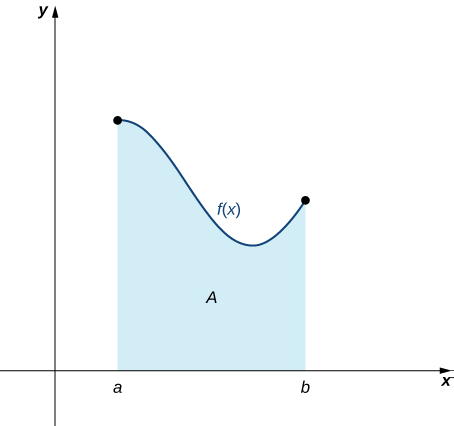

100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Caption from CLIP model: A drawing of a person riding a wave on a board.
Enhanced caption: A drawing of a person riding a wave on a board, illustrating the concept of approximating the area under a curve in a geometric context.
Time used: 2.571810722351074


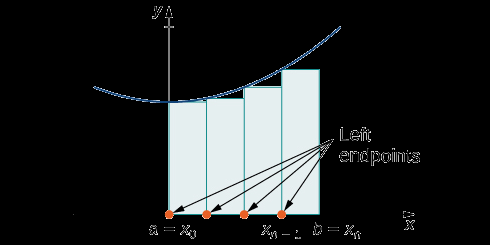

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Caption from CLIP model: A drawing of a woman in a yellow vest.
Enhanced caption: A drawing of a woman in a yellow vest, illustrating a left-endpoint approximation used to determine area under a curve with rectangles.
Time used: 2.011884927749634


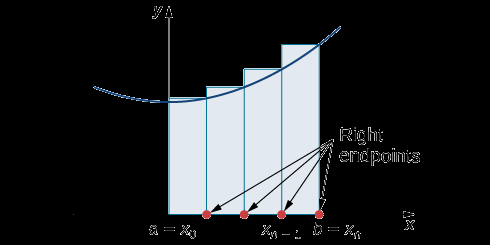

100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


Caption from CLIP model: A drawing of a woman in a white top and a blue and white graduation gown.
Enhanced caption: A drawing of a woman in a white top and a blue and white graduation gown, potentially celebrating an achievement related to the study of area under a curve in calculus.
Time used: 2.1501829624176025


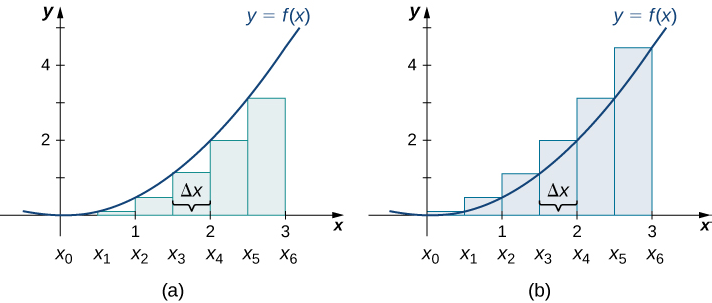

100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Caption from CLIP model: A drawing of a curve in a curve with a wave.
Enhanced caption: A drawing illustrating the right-endpoint approximation of the area under a curve using rectangular areas. It includes methods of approximating the area under a curve by drawing vertical lines at each right endpoint.
Time used: 6.7470383644104


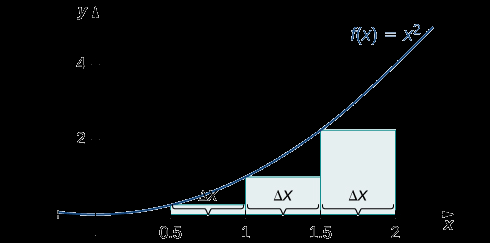

100%|██████████| 1/1 [00:00<00:00,  3.99it/s]


Caption from CLIP model: A drawing of a train going down a hill.
Enhanced caption: A drawing of a train going down a hill, illustrating the movement parallel to the analysis of approximating areas under curves with left-endpoint and right-endpoint methods.
Time used: 1.920811414718628


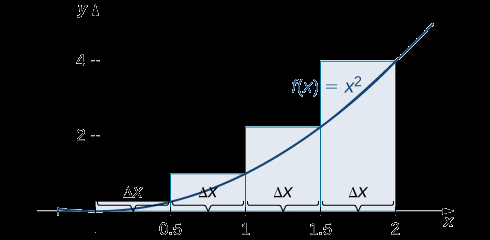

100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


Caption from CLIP model: A drawing of a train with a white and blue wave.
Enhanced caption: A drawing of a train with a white and blue wave, illustrating a concept related to right-endpoint approximation in mathematics.
Time used: 1.6298115253448486


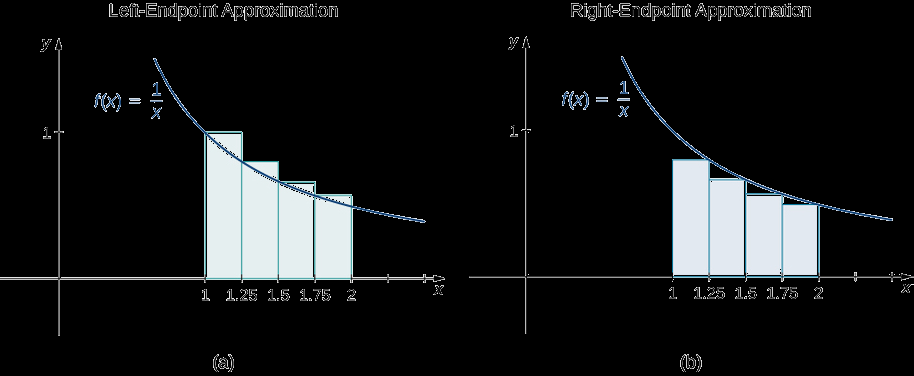

100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


Caption from CLIP model: A drawing of a white and yellow graduation sign.
Enhanced caption: A drawing of a white and yellow graduation sign, likely related to concepts of approximation and estimation in calculus as discussed in the source context.
Time used: 2.070683479309082


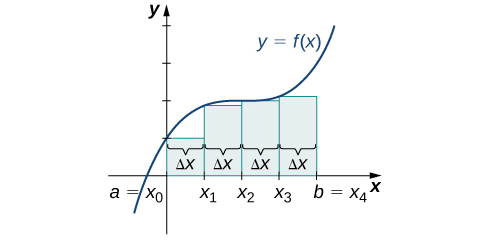

100%|██████████| 1/1 [00:00<00:00,  4.05it/s]


Caption from CLIP model: A drawing of a slide with a calculator on it.
Enhanced caption: A drawing of a slide with a calculator on it, illustrating the concept of left-endpoint approximation in calculus.
Time used: 1.56016206741333


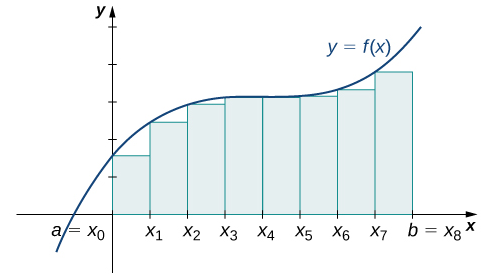

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


Caption from CLIP model: A large white slide with a large green curve.
Enhanced caption: A large white slide depicts a green curve divided into eight subintervals, illustrating the approximation of the area under the curve using inscribed rectangles.
Time used: 1.996657371520996


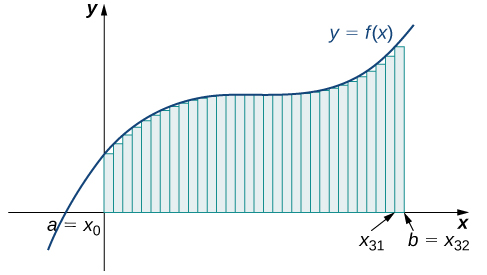

100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


Caption from CLIP model: A drawing of a curve in a wave machine.
Enhanced caption: A drawing of a curve in a wave machine, illustrating a function with rectangles inscribed under the curve for a left-endpoint approximation.
Time used: 5.650818824768066


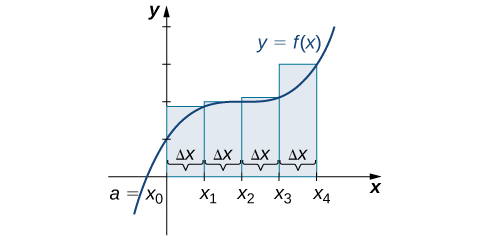

100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


Caption from CLIP model: A drawing of a curve in a sheet of paper.
Enhanced caption: A drawing of a curve in a sheet of paper, illustrating a right-endpoint approximation method using four rectangles to estimate the area under the curve.
Time used: 1.8271944522857666


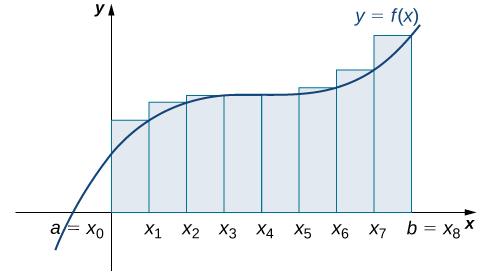

100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


Caption from CLIP model: A large white square with a blue curve.
Enhanced caption: A large white square representing a region divided into eight equal subintervals, with a blue curve illustrating the right-endpoint approximation for the area.
Time used: 1.9948463439941406


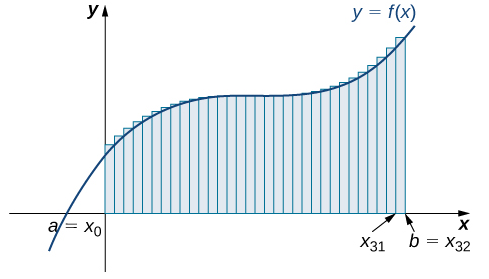

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Caption from CLIP model: A large slide with a large white figure on it.
Enhanced caption: A large slide depicting a right-endpoint approximation with rectangles that help illustrate the area under a curve. This visual aids in understanding how approximations improve as the number of subintervals increases.
Time used: 2.3458900451660156


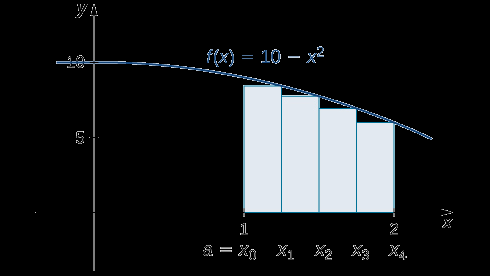

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Caption from CLIP model: A large white square wave is projected onto a whiteboard.
Enhanced caption: A large white square wave is projected onto a whiteboard, illustrating a right-endpoint approximation of the area bounded by the curve and the x-axis for the Riemann sum.
Time used: 2.5721163749694824


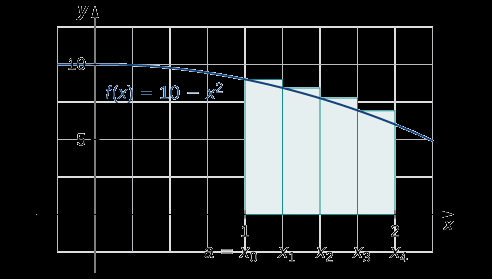

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


Caption from CLIP model: A large wave is being projected onto a concrete wall.
Enhanced caption: A large wave is being projected onto a concrete wall, possibly as part of an illustration related to mathematical concepts such as upper and lower sums.
Time used: 2.263967990875244


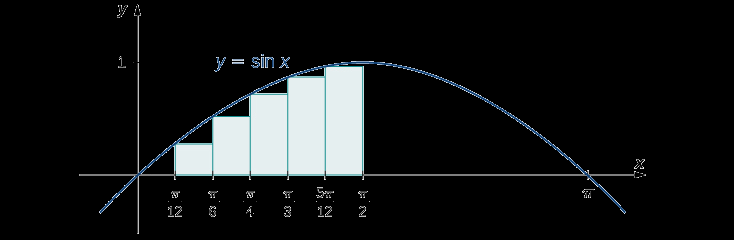

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Caption from CLIP model: A white sign with numbers on it in front of a blue sky.
Enhanced caption: A white sign with numbers on it is displayed in front of a blue sky, possibly indicating a graphing area related to a mathematical problem involving six regions.
Time used: 3.8193795680999756
### Example Document: Apple Intelligence features are now available in traditional Chinese - Apple (HK).pdf ###


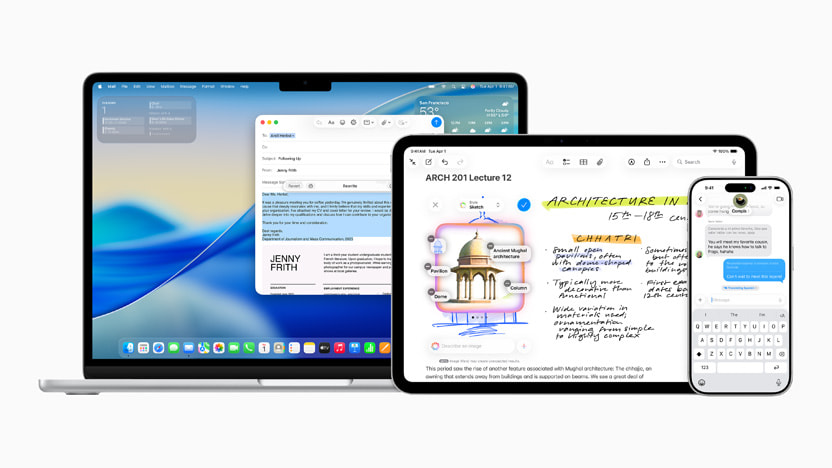

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


Caption from CLIP model: A laptop computer with a screen showing a picture of a man.
Enhanced caption: A laptop computer with a screen showing a picture of a man, highlighting Apple's Intelligence features that have expanded to eight new languages, including traditional Chinese.
Time used: 2.123255968093872


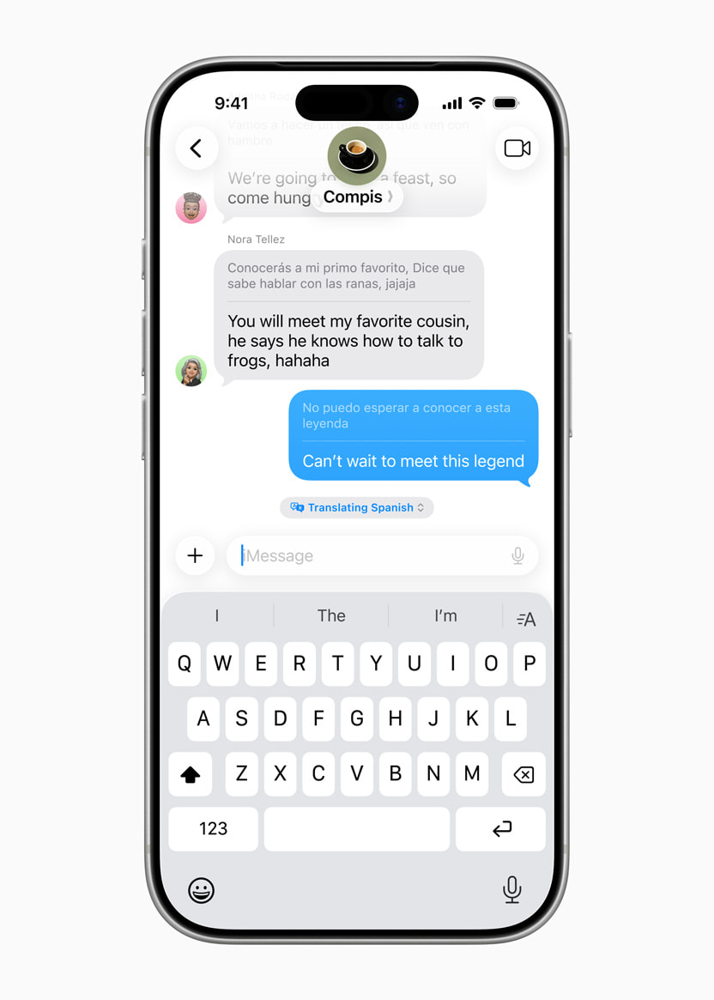

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Caption from CLIP model: A person is typing on a cell phone.
Enhanced caption: A person is typing on a cell phone, likely using a messaging app that integrates Apple’s Live Translation features for seamless communication.
Time used: 3.367237091064453


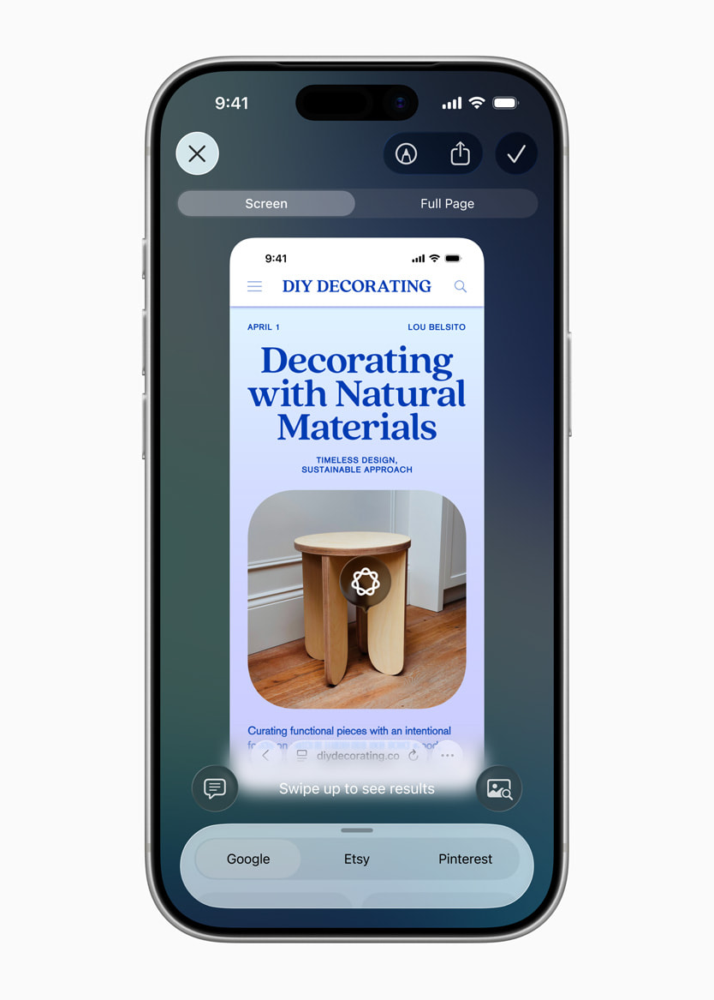

100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


Caption from CLIP model: A phone is shown on a wooden table.
Enhanced caption: A phone is shown on a wooden table, highlighting how visual intelligence on the iPhone aids users in learning about objects and places around them.
Time used: 2.101877212524414


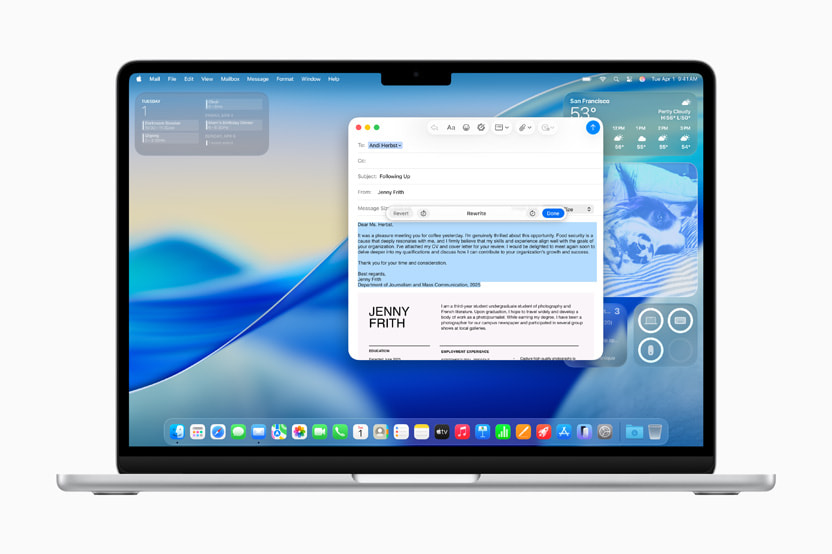

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Caption from CLIP model: A man is typing on a laptop computer.
Enhanced caption: A man is typing on a laptop computer using Writing Tools to refine his text with options like Rewrite, Proofread, and Summarize.
Time used: 2.3101272583007812


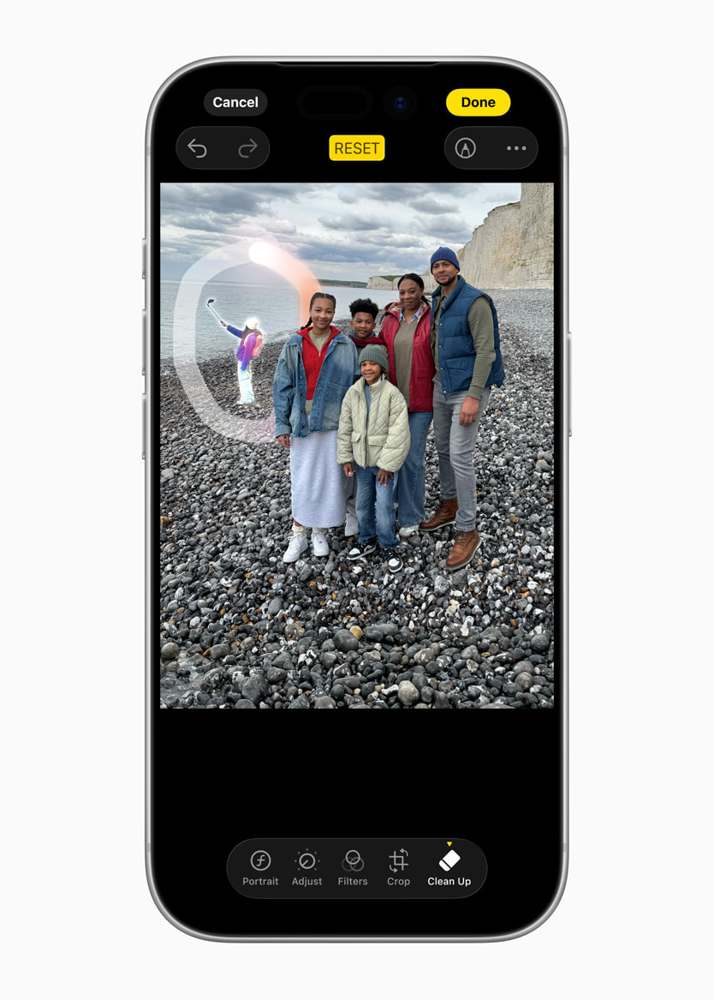

100%|██████████| 1/1 [00:00<00:00,  3.67it/s]


Caption from CLIP model: A group of people standing next to each other.
Enhanced caption: A group of people standing next to each other, demonstrating the editing features of Clean Up to remove distractions in the background.
Time used: 2.047715425491333


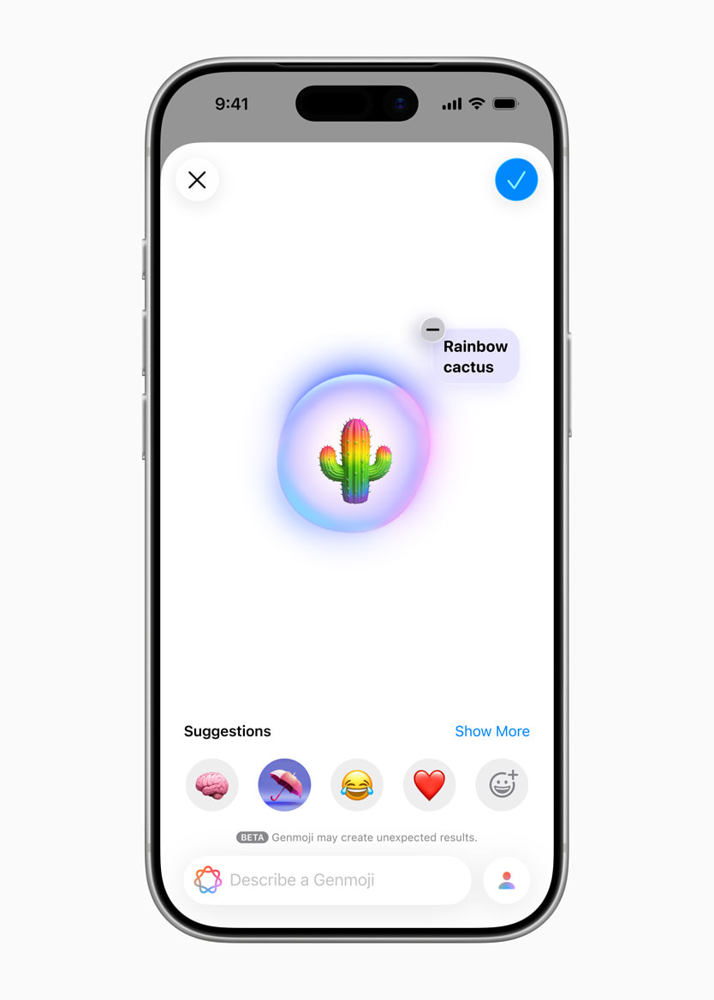

100%|██████████| 1/1 [00:00<00:00,  4.25it/s]


Caption from CLIP model: A picture of a person holding a cell phone.
Enhanced caption: A picture of a person holding a cell phone, likely using Genmoji to create unique emojis for more playful conversations.
Time used: 1.9050829410552979


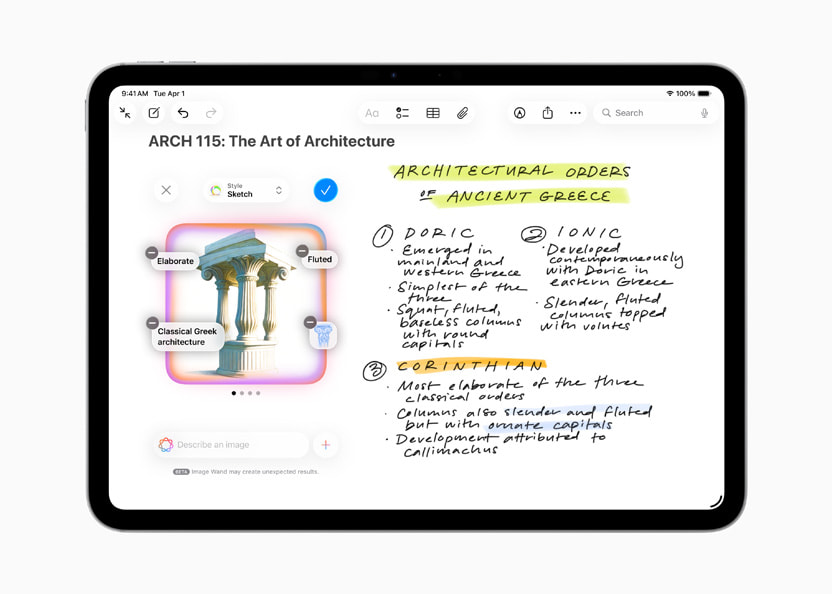

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Caption from CLIP model: A book with a picture of a laptop and a map of the world.
Enhanced caption: A book featuring a laptop and a world map, illustrating the functionality of the Image Wand tool for creating images based on captured context in notes.
Time used: 2.150627374649048


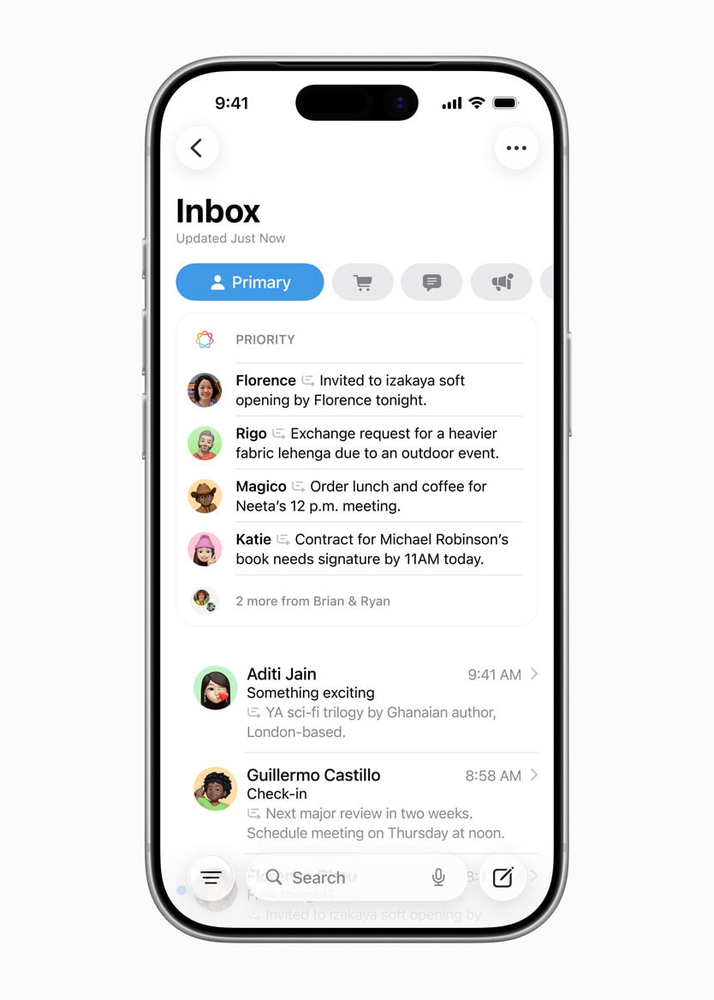

100%|██████████| 1/1 [00:00<00:00,  3.91it/s]


Caption from CLIP model: A picture of a woman on a cell phone.
Enhanced caption: A picture of a woman on a cell phone, likely engaged in reviewing Priority Messages in her email inbox.
Time used: 1.9809391498565674


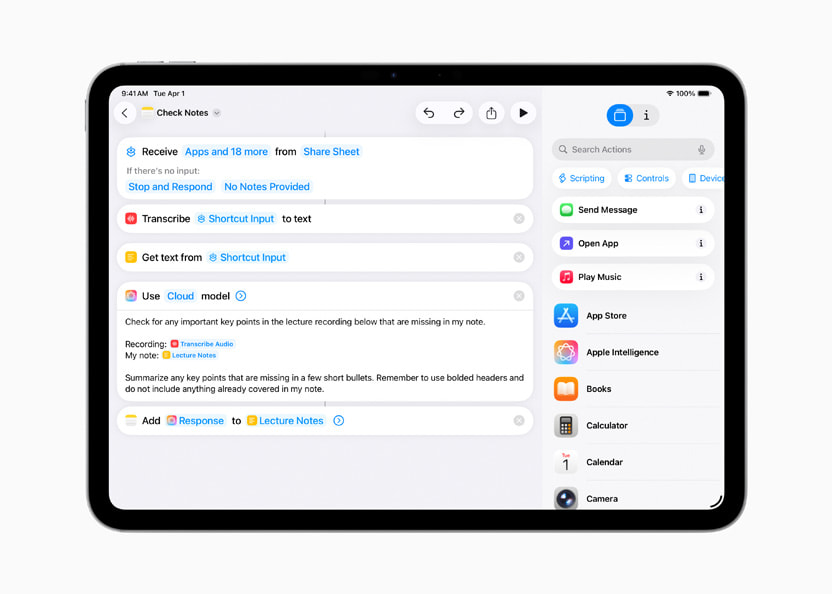

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Caption from CLIP model: A picture of a phone and a picture of a laptop.
Enhanced caption: A picture of a phone and a laptop, highlighting the use of Apple Intelligence for intelligent actions and automations in Shortcuts.
Time used: 4.055144309997559


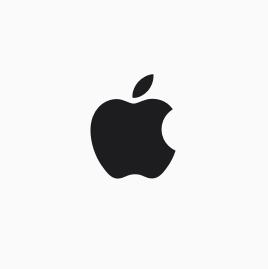

100%|██████████| 1/1 [00:00<00:00,  3.69it/s]


Caption from CLIP model: An apple logo is attached to an apple computer.
Enhanced caption: An apple logo is attached to an apple computer, highlighting Apple's product lineup including the new iPad Pro and 14-inch MacBook Pro announced in their fourth quarter results.
Time used: 3.6988027095794678


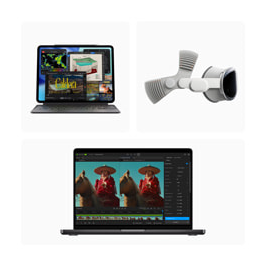

100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


Caption from CLIP model: A picture of a laptop and a camera.
Enhanced caption: A picture of a laptop and a camera, showcasing Apple's new products like the 14-inch MacBook Pro and Apple Vision Pro available from 22 October 2025.
Time used: 2.537875175476074


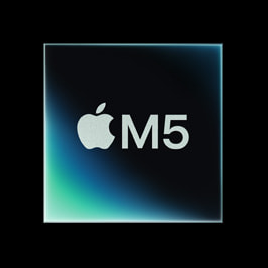

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Caption from CLIP model: An apple logo is on the screen of an apple laptop.
Enhanced caption: An apple logo is on the screen of an Apple laptop, featured in a press release about the M5, the next big leap in AI performance for Apple silicon on 15 October 2025.
Time used: 3.42634916305542
### Example Document: Transport Arrangement for Fall Term _ Campus Services Office.pdf ###


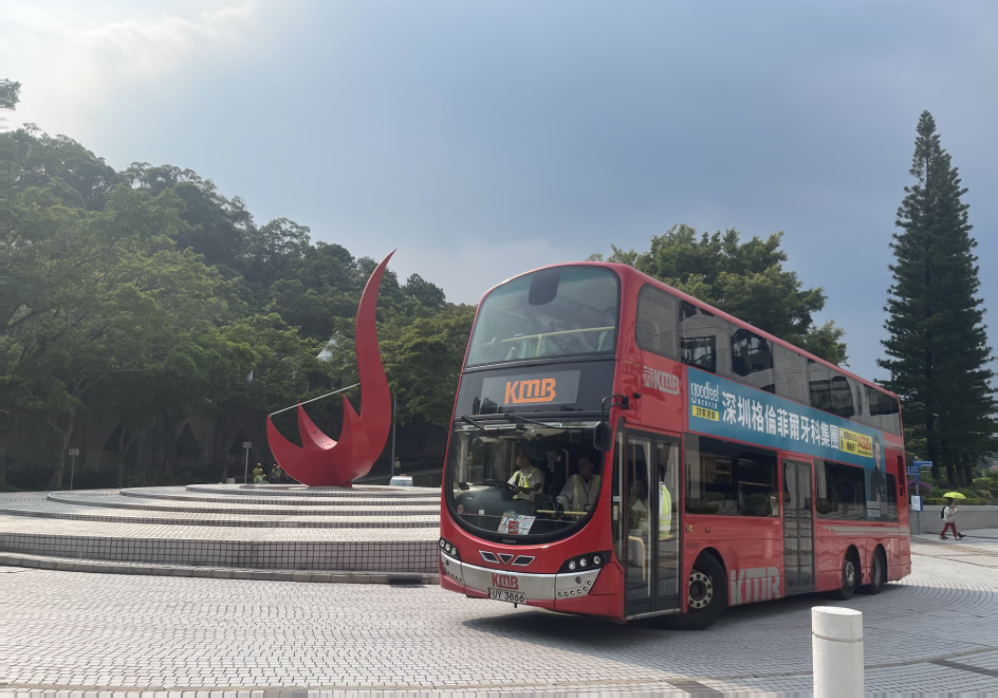

100%|██████████| 1/1 [00:00<00:00,  3.80it/s]


Caption from CLIP model: A double decker bus parked in a parking lot.
Enhanced caption: A double decker bus parked in a parking lot, likely serving the 91B route to The Hong Kong University of Science and Technology.
Time used: 3.6444478034973145


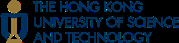

100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


Caption from CLIP model: A bunch of numbers written on a wall.
Enhanced caption: A bunch of numbers related to campus services written on a wall. This includes information for students, faculty, staff, residents, and guests.
Time used: 1.7371995449066162


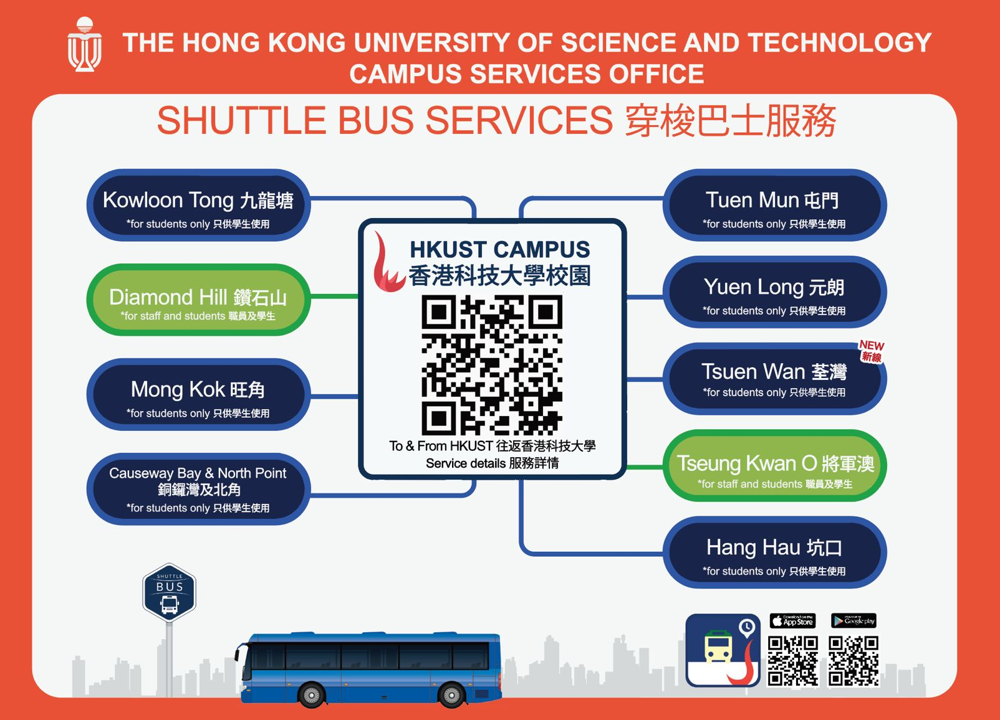

100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


Caption from CLIP model: A bus with a tour guide on the side of it.
Enhanced caption: A bus with a tour guide on the side of it, likely part of the university's transportation to accommodate students and guests as the fall semester begins on September 1.
Time used: 2.421431541442871


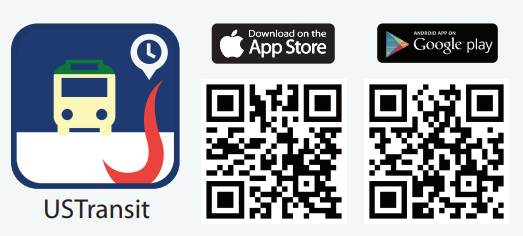

100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


Caption from CLIP model: A picture of two cell phones with the caption "To The World".                                                     
Enhanced caption: A picture of two cell phones with the caption "To The World," highlighting the availability of the USTransit app for real-time bus arrival information.
Time used: 2.8511810302734375


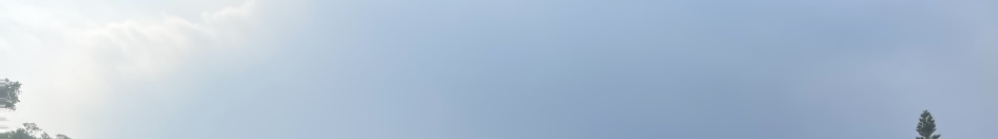

100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


Caption from CLIP model: A view of a bunch of traffic lights from a distance.
Enhanced caption: A view of a bunch of traffic lights from a distance near the Hang Hau Express 91B bus service drop-off point.
Time used: 1.947664499282837


100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


Caption from CLIP model: A bunch of different types of signs on a wall.
Enhanced caption: A bunch of different types of signs on a wall, including information on public transport options and enhanced bus services during busy hours.
Time used: 1.7580394744873047


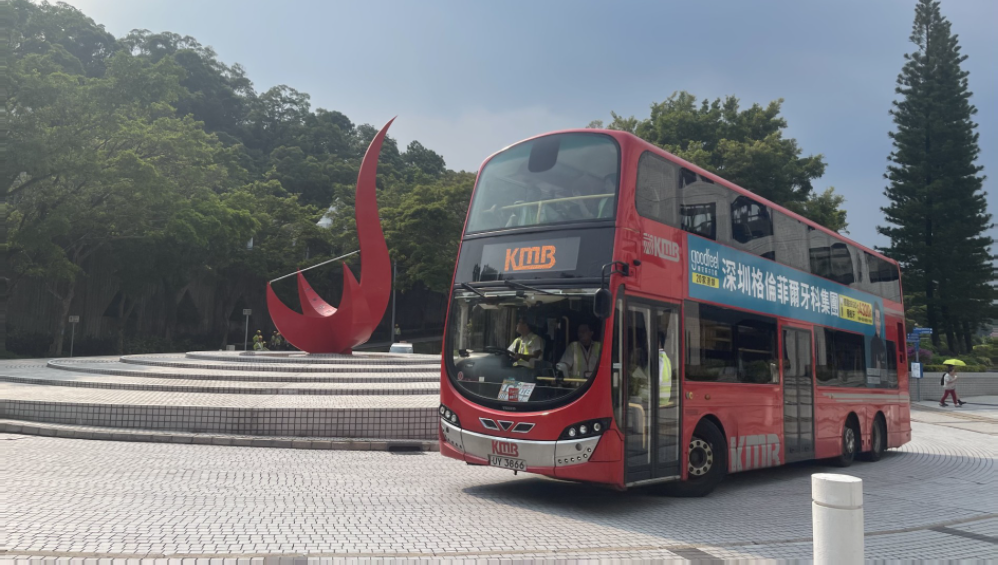

100%|██████████| 1/1 [00:00<00:00,  6.69it/s]


Caption from CLIP model: Two double decker buses parked next to each other.
Enhanced caption: Two double decker buses parked next to each other, including the Special Bus 91P, which has resumed operations during peak hours with newly added trips.
Time used: 2.152498722076416


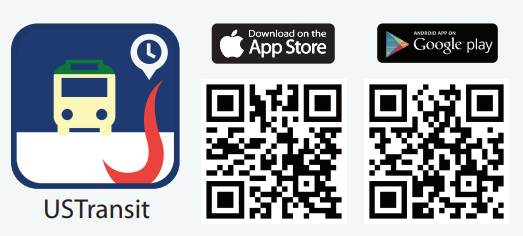

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


Caption from CLIP model: A picture of two cell phones with the caption "To The World".                                                     
Enhanced caption: A picture of two cell phones with the caption "To The World," promoting the upgraded ETA (USTransit) app developed by the HKUST alumni team for bus and minibus arrival information.
Time used: 2.9829063415527344


100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


Caption from CLIP model: A computer terminal with a bunch of numbers and letters.
Enhanced caption: A computer terminal displaying data related to public transport services, including bus and minibus schedules and the upgraded ETA app for HKUST.
Time used: 1.720780611038208


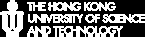

100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


Caption from CLIP model: A bunch of words written in a foreign language.
Enhanced caption: Text in a foreign language related to various services such as restaurants, meatless options, shuttle bus, and public transport.
Time used: 1.6867783069610596
### Example Document: Underwater SLAM for Marine Robot Navigation _ HKUST CSE.pdf ###


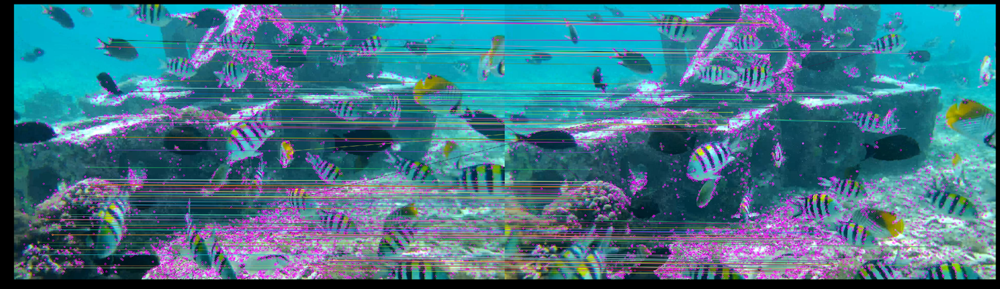

100%|██████████| 1/1 [00:00<00:00,  6.43it/s]


Caption from CLIP model: A group of fish swimming in a pool of water.
Enhanced caption: A group of fish swimming in a pool of water, illustrating challenges in developing a robust SLAM system for underwater environments.
Time used: 1.9219458103179932


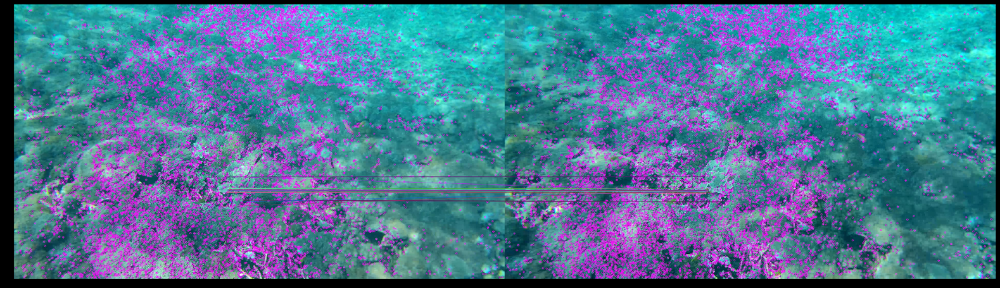

100%|██████████| 1/1 [00:00<00:00,  7.26it/s]


Caption from CLIP model: Two pictures of a green and pink traffic light.
Enhanced caption: Two pictures of a green and pink traffic light, illustrating the impact of dynamic light on feature matching in pose estimation for SLAM.
Time used: 2.7249107360839844


In [41]:
import time

llmforCaption = LLMforCaption()

docs = [
    "5.1_ Approximating Areas - Mathematics LibreTexts.pdf",
    "Apple Intelligence features are now available in traditional Chinese - Apple (HK).pdf",
    "Transport Arrangement for Fall Term _ Campus Services Office.pdf",
    "Underwater SLAM for Marine Robot Navigation _ HKUST CSE.pdf"
]

time_used_list = []

for doc in docs:
  print(f"### Example Document: {doc} ###")
  images_and_contexts = extract_images_with_context(pdf_path=f"/content/{doc}", output_image_dir="/content/")

  for image_context in images_and_contexts:
    start = time.time()
    img_path = image_context["image_path"]
    img = PIL.Image.open(img_path)
    img.show()

    CLIP_caption = get_CLIP_caption_from_image(img_path)
    enhanced_caption = llmforCaption.get_caption(simple_caption=CLIP_caption, context=image_context["context"])

    end = time.time()
    time_used = end - start
    time_used_list.append(time_used)

    print(f"Caption from CLIP model: {CLIP_caption}")
    print(f"Enhanced caption: {enhanced_caption}")
    print(f"Time used: {time_used}")